In [1]:
### Import Libraries

import tensorflow as tf

import os

import numpy as np

import pandas as pd

import matplotlib.pyplot as plt

import tensorflow as tf

import cv2

2023-01-03 00:55:25.826716: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-03 00:55:28.933476: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-01-03 00:55:29.973269: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-01-03 00:55:29.973292: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore 

In [2]:
# Some basic parameters

inpDir = '../input' # location where input data is stored
outDir = '../output' # location to store outputs
dataDir = 'basic_operations'

RANDOM_STATE = 24 # for initialization ----- REMEMBER: to remove at the time of promotion to production

np.random.seed(RANDOM_STATE) # Set Random Seed for reproducible  results


# Set parameters for decoration of plots
params = {'legend.fontsize' : 'large',
          'figure.figsize'  : (15,12),
          'axes.labelsize'  : 'x-large',
          'axes.titlesize'  :'x-large',
          'xtick.labelsize' :'large',
          'ytick.labelsize' :'large',
         }


CMAP = 'jet'

LINE_THICK = 1

MARK_COLOR = (15, 82, 186)

plt.rcParams.update(params) # update rcParams

# Helper functions

#### Function to read an image

In [3]:
def fn_read_image(fileName):
  '''
    Args
  '''
  imgPath=os.path.join(inpDir,dataDir,fileName)

  #Read image file
  im=cv2.imread(imgPath,cv2.IMREAD_COLOR)

  if im is None:
    print('Could not open or find the image',fileName)
    exit(0)
  else:
    #Convert to RGB image
    rgbIm=cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
    return im,rgbIm

#### Function to plot one image

In [4]:
#Showing this image

def fn_plot_one_img(im):
  '''
  
  '''
  #Showing image
  plt.imshow(im) #Plotting the image
  plt.axis('off') #no axis to dispLay
  
  #plt.savefig

#### Function to plot many images

In [5]:
def fn_plot_images(im_lst):
  """
  
  """
  nRows=1
  nCols=len(im_lst)

  fig,axes=plt.subplots(nRows,nCols)

  for i in range(nCols):

    #Display image
    axes[i].imshow(im_lst[i]['img'],cmap=im_lst[i]['cmap'])

    #Setting title of individual plot
    axes[i].set_title(im_lst[i]['name'])

    #Remove axis tics from the plot
    axes[i].set_xticklabels([]);
    axes[i].set_yticklabels([]);
  #Optiize thfn_plot_imagese plot layout
  plt.tight_layout()

## RGB TrackBar

In [ ]:
def nothing(x):
    '''
     Do nothing ! Good!
    '''
    pass
 
# Create a black image, a window
blankImg = np.zeros((512,512,3), np.uint8)

cv2.namedWindow('image',cv2.WINDOW_NORMAL)

# create trackbars for color change
cv2.createTrackbar('Red','image',0,255,nothing)
cv2.createTrackbar('Green','image',0,255,nothing)
cv2.createTrackbar('Blue','image',0,255,nothing)


while True:
    
    cv2.imshow('image',blankImg)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
    # get current positions of three trackbars
    r = cv2.getTrackbarPos('Red','image')
    g = cv2.getTrackbarPos('Green','image')
    b = cv2.getTrackbarPos('Blue','image')
    
    print (r, b, g)
    
    blankImg[:] = [b,g,r]
    
cv2.destroyAllWindows()

In [ ]:
# Create a black image, a window
blankImg = np.zeros((512,512,3), np.uint8)
cv2.namedWindow('TrackerBars',cv2.WINDOW_NORMAL)

# create trackbars for color change
cv2.createTrackbar('H','TrackerBars',0,180,nothing)
cv2.createTrackbar('S','TrackerBars',0,255,nothing)
cv2.createTrackbar('I','TrackerBars',0,255,nothing)

while(True):
    cv2.imshow('image',blankImg)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
    # get current positions of four trackbars
    h = cv2.getTrackbarPos('H','TrackerBars')
    s = cv2.getTrackbarPos('S','TrackerBars')
    v = cv2.getTrackbarPos('I','TrackerBars')
    
    blankImg[:,:] = [h,s,v]
    blankImg = cv2.cvtColor(blankImg, cv2.COLOR_HSV2BGR)
    
cv2.destroyAllWindows()

## Arithmetic Operations 

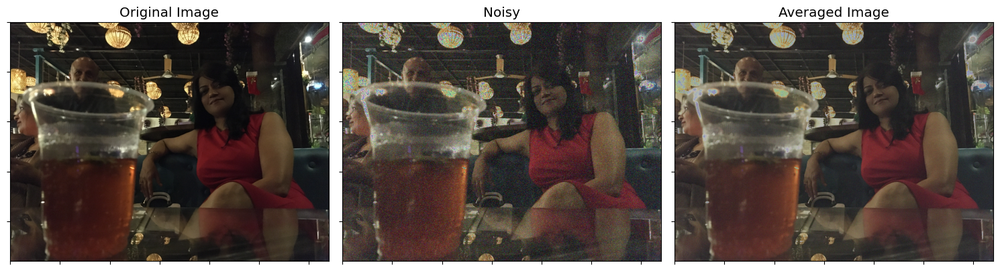

In [8]:
# Load original image
imgFileName = '/home/dai/directory_env/notebooks/input/basic_operations/dark_image.png'

srcImg, rgbImg = fn_read_image(imgFileName)

# Resizing to fit terminal
srcImg = cv2.resize(srcImg, ( 1280, 960))

# Create list to store noisy images
images = []

# Generate noisy images using cv2.randn. Can use your own mean and std.
for _ in range(20):
    
    img1 = srcImg.copy() 
    
    cv2.randn(img1,(0,0,0),(50,50,50))
    
    images.append ( srcImg + img1 )

    
# For averaging create an empty array, then add images to this array.

avgImg = np.zeros((srcImg.shape[0],
                   srcImg.shape[1],
                   srcImg.shape[2]), np.float32)

for im in images:
    
    avgImg = avgImg + im / 20


# Round the float values. Always specify the dtype

avgImg = np.array ( np.round ( avgImg ), dtype=np.uint8 )

rgbImg = cv2.cvtColor(srcImg, cv2.COLOR_BGR2RGB)
avgImg = cv2.cvtColor(avgImg, cv2.COLOR_BGR2RGB)
noisyImg = cv2.cvtColor(images[0], cv2.COLOR_BGR2RGB)

# Display the images
img_lst = [{'img': rgbImg, 'name': 'Original Image','cmap' : CMAP},
           {'img': noisyImg, 'name': 'Noisy','cmap' : CMAP},
           {'img': avgImg, 'name': 'Averaged Image','cmap' : CMAP}]

fn_plot_images(img_lst)

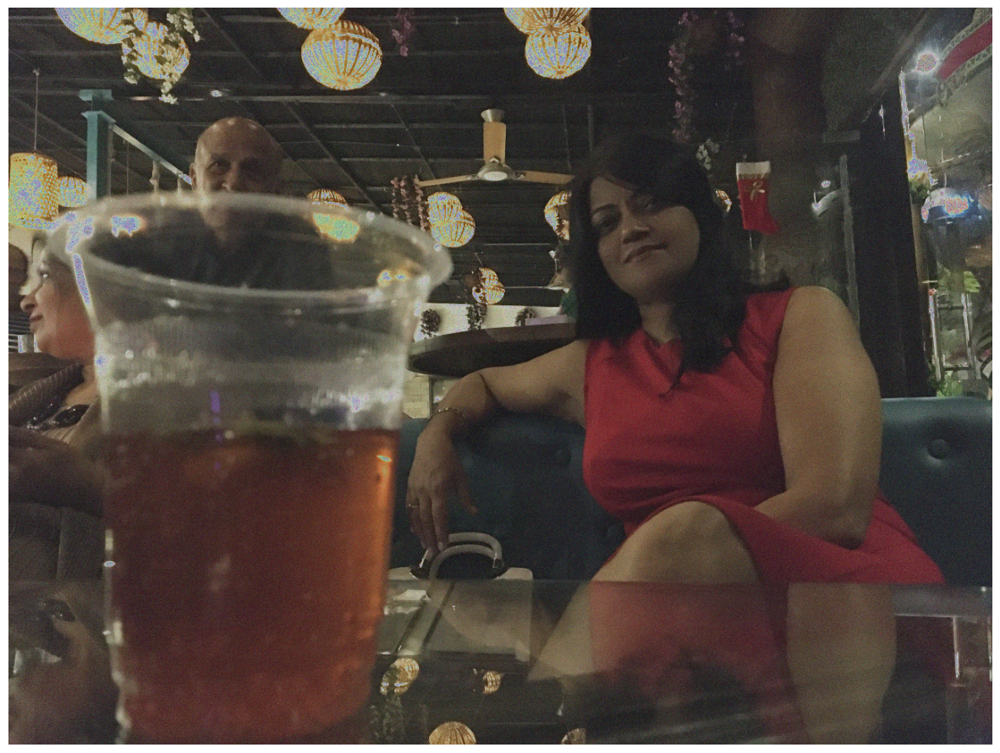

In [9]:
fn_plot_one_img(avgImg)

## Intensity Transformation

Basic types of transformation functions used for image enhancement are:

>Linear (Negative and Identity Transformations)

>Log and inverse-log transformations

>Power Law transformations

### Negative Transformation

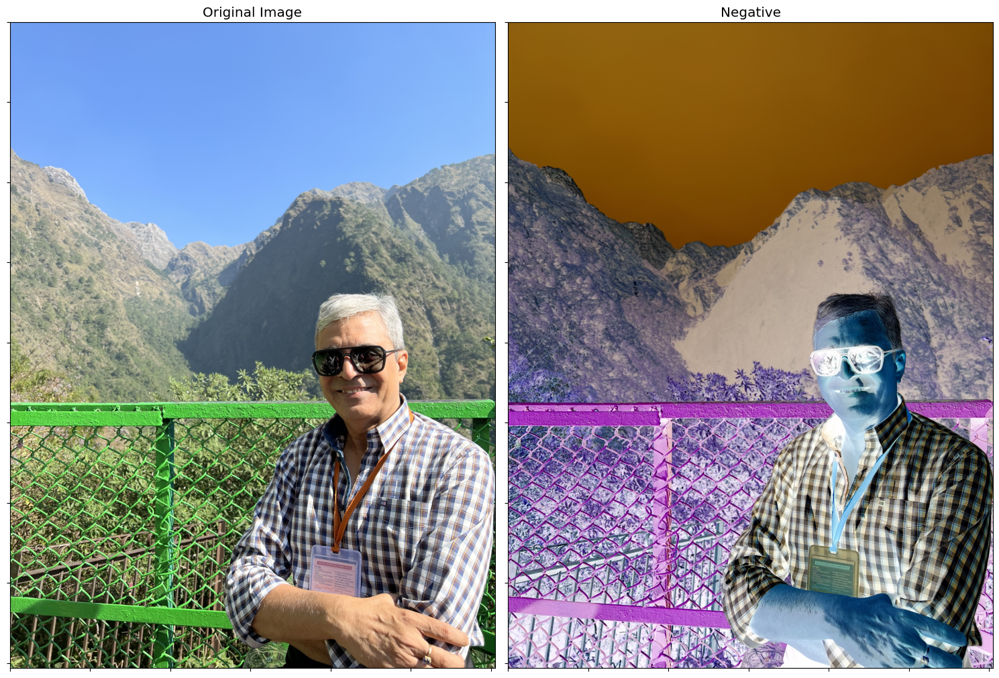

In [10]:
# Load original image
imgFileName = '/home/dai/directory_env/notebooks/input/basic_operations/bright_image.JPG'

srcImg, rgbImg = fn_read_image(imgFileName)

# Create Negative image
negImg = cv2.bitwise_not(srcImg)

#rgbImg = cv2.cvtColor(srcImg, cv2.COLOR_BGR2RGB)
negImg = cv2.cvtColor(negImg, cv2.COLOR_BGR2RGB)

# Display the images
img_lst = [{'img': rgbImg, 'name': 'Original Image','cmap' : CMAP},
           {'img': negImg, 'name': 'Negative','cmap' : CMAP}]

fn_plot_images(img_lst)

### Log Transformation

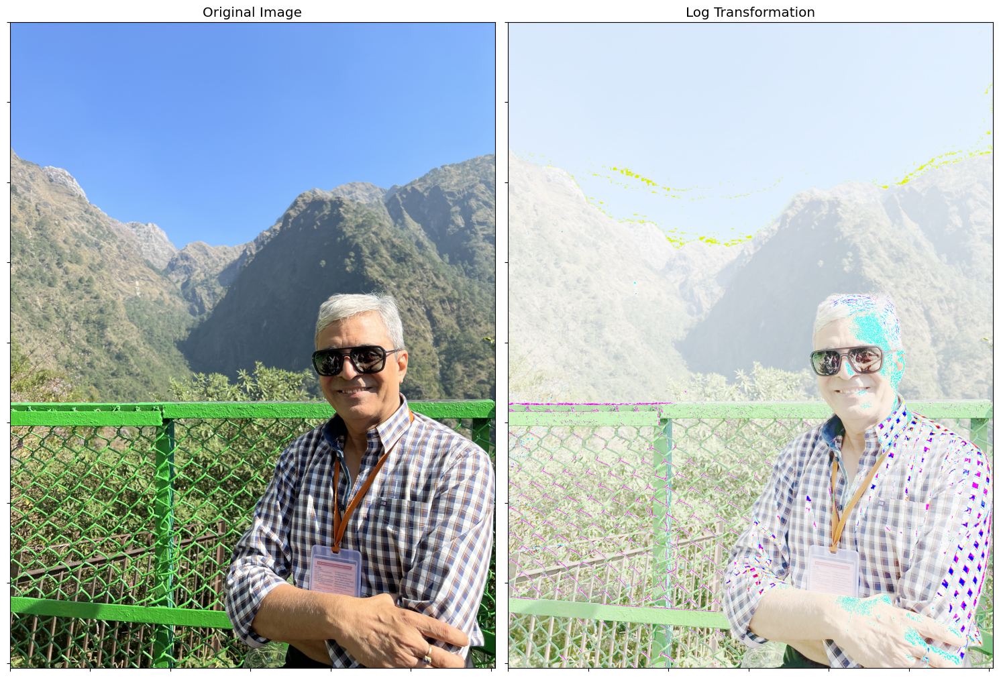

In [11]:
# Apply log transformation method
c = 255 / np.log1p(1+np.max(srcImg))


logImg = np.array((c * (np.log1p(1+srcImg))), dtype = 'uint8')

rgbImg = cv2.cvtColor(srcImg, cv2.COLOR_BGR2RGB)
logImg = cv2.cvtColor(logImg, cv2.COLOR_BGR2RGB)

# Display the images
img_lst = [{'img': rgbImg, 'name': 'Original Image','cmap' : CMAP},
           {'img': logImg, 'name': 'Log Transformation','cmap' : CMAP}]

fn_plot_images(img_lst)

### Gamma Transformation

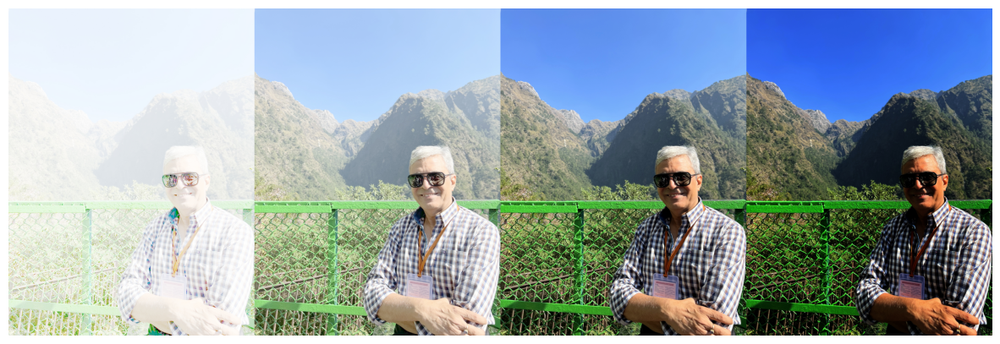

In [12]:
file_list = []

# Trying 4 gamma values.
for gamma in [0.1, 0.5, 1.2, 2.2]:
      
    # Apply gamma correction.
    gamma_corrected = np.array(255*(srcImg / 255) ** gamma, 
                               dtype = 'uint8')
  
    # create gamma file name
    gmaFileName = os.path.join(outDir, 
                               f'{imgFileName}_gamma_{gamma}.jpg')
    
    # Save edited images.
    cv2.imwrite(gmaFileName,
                gamma_corrected)
    
    file_list.append(gmaFileName)
    
img_list = []

for f in  file_list:
    
    gImg = cv2.imread(f, cv2.IMREAD_COLOR)
    
    gImg = cv2.cvtColor(gImg, cv2.COLOR_BGR2RGB)
    
    img_list.append(gImg)

gammaImg = np.hstack(img_list)

# Display the images
fn_plot_one_img(gammaImg)

In [ ]:
# Load original image
imgFileName = '/home/dai/directory_env/notebooks/input/basic_operations/car_1.jpeg'

def fn_empty(a):
    pass

# Create a window
cv2.namedWindow('TrackerBars',cv2.WINDOW_NORMAL)

# create trackbars for color change
cv2.createTrackbar('Hue Min', 'TrackerBars',   0, 179, fn_empty)
cv2.createTrackbar('Hue Max', 'TrackerBars',  19, 179, fn_empty)
cv2.createTrackbar('Sat Min', 'TrackerBars', 110, 255, fn_empty)
cv2.createTrackbar('Sat Max', 'TrackerBars', 240, 255, fn_empty)
cv2.createTrackbar('Val Min', 'TrackerBars', 153, 255, fn_empty)
cv2.createTrackbar('Val Max', 'TrackerBars', 250, 255, fn_empty)

while(True):
    
    srcImg, rgbImg = fn_read_image(imgFileName)
    #srcImg = cv2.resize(srcImg, ( 960, 1280))
    
    hsvImg = cv2.cvtColor(srcImg, cv2.COLOR_BGR2HSV)
                
    # get current positions of four trackbars
    h_min = cv2.getTrackbarPos('Hue Min','TrackerBars')
    h_max = cv2.getTrackbarPos('Hue Max','TrackerBars')
    s_min = cv2.getTrackbarPos('Sat Min','TrackerBars')
    s_max = cv2.getTrackbarPos('Sat Max','TrackerBars')
    v_min = cv2.getTrackbarPos('Val Min','TrackerBars')
    v_max = cv2.getTrackbarPos('Val Max','TrackerBars')
     
    lower = np.array([h_min, s_min, v_min])
    
    upper = np.array([h_max, s_max, v_max])
    
    maskImg = cv2.inRange(hsvImg, lower, upper)

    cv2.imshow('Original',srcImg)
    cv2.imshow('HSV',hsvImg)
    cv2.imshow('Mask',maskImg)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cv2.destroyAllWindows()